# Model: UNet++

## Approach: Transfer Learning with Progressive Fine-Tuning

This work investigates the transferability of features from a model pretrained on **brain tumor MRI** to the task of **liver tumor CT segmentation** using the UNet++ architecture.

## Strategy: Progressive Fine-Tuning

 we leverage a pretrained model and progressively fine-tune it by gradually unfreezing encoder and decoder layers. This allows us to evaluate how much knowledge from the source domain contributes to the target task.

## Enhancement: Combined Loss Function

To guide the model toward more anatomically consistent outputs, we introduce a composite loss function that combines **Dice loss** with a **shape prior loss** derived from the training masks.

## Data Augmentation

To increase model robustness and generalization, the training data was augmented using:
- **Elastic deformation**
- **Translation** of ±10 pixels
- **Horizontal flipping**

## Domains

- **Source Domain**: Brain Tumor MRI (pretrained model)
- **Target Domain**: Liver Tumor CT


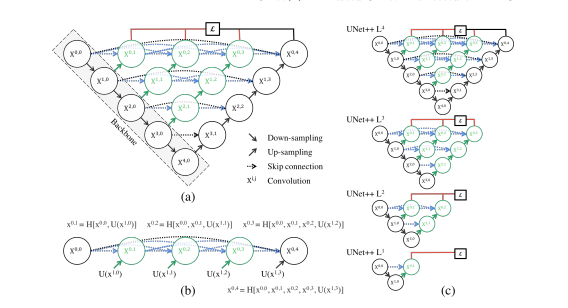

##Shape prior Heatmap:

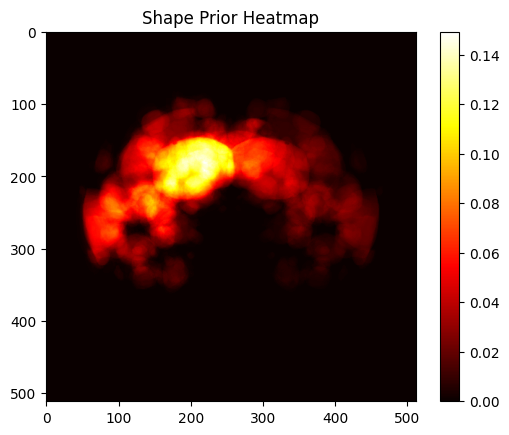

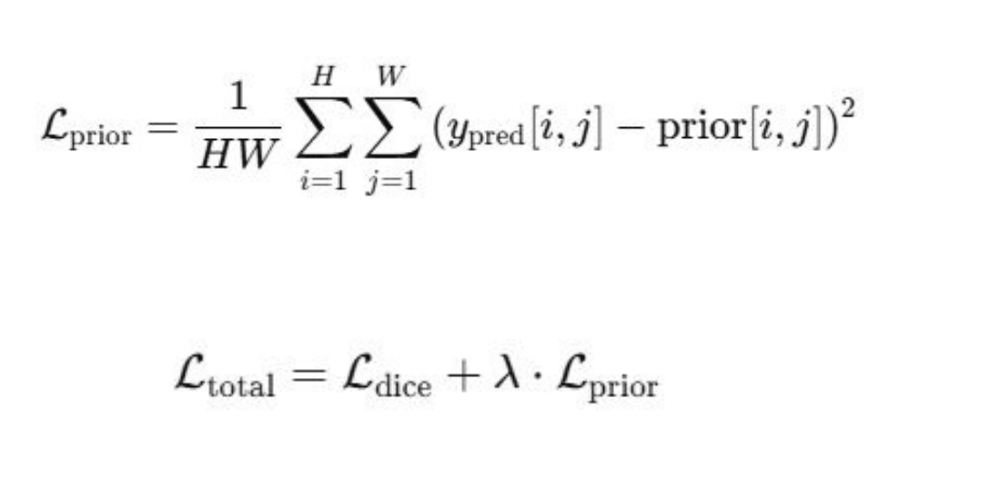

In [ ]:
!apt-get install unrar


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [ ]:
!pip install -U tensorflow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 774.9 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 90.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 98.5 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.18.0
    Uninstalling tensorboard-2.18.0:
      Successfully uninstalled tensorboard-2.18.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.18.0
    Uninstalling tensorflow-2.18.0:
      Successfully uninstalled tensorflow-2.18.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-text 2.18.1 requires tensorflow<2.19,>=2.18.0, but you have tensorflo

In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import cv2
import gc
import tensorflow as tf
from tensorflow.keras.models import load_model
import glob


##use the pretrained model on brain MRI and apply for inference directly for liver ct(no training)

###Evaluate on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

In [ ]:

# === DICOMDataGen ===
class DICOMDataGen(tf.keras.utils.Sequence):
    def __init__(self, image_ids, img_path, mask_path, batch_size=4, image_size=512, shuffle=True):
        self.ids = image_ids
        self.img_path = img_path
        self.mask_path = mask_path
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __load__(self, item):
        image = cv2.imread(os.path.join(self.img_path, item), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
        mask = cv2.imread(os.path.join(self.mask_path, item), cv2.IMREAD_GRAYSCALE).astype(np.float32)
        mask = (mask >= 255).astype(np.float32)

        image = cv2.resize(image, (self.image_size, self.image_size), interpolation=cv2.INTER_LINEAR)
        mask = cv2.resize(mask, (self.image_size, self.image_size), interpolation=cv2.INTER_NEAREST)

        return np.expand_dims(image, axis=-1), np.expand_dims(mask, axis=-1)

    def __getitem__(self, index):
        batch_ids = self.ids[index * self.batch_size : (index + 1) * self.batch_size]

        batch = []
        for i in batch_ids:
            result = self.__load__(i)
            if result is None or len(result) != 2:
                print(f" Skipping {i} — __load__() returned invalid result: {result}")
                continue
            batch.append(result)

        if len(batch) == 0:
            print(f" Empty batch at index {index}")
            return [], []

        images, masks = zip(*batch)
        return np.array(images), np.array(masks)


    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.ids)
        gc.collect()

    def __len__(self):
        return int(np.ceil(len(self.ids) / self.batch_size))


# === Metrics and Loss Functions ===
def dice_coef(y_true, y_pred):
    smooth = 1e-6
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1. - dice_coef(y_true, y_pred)

def iou_score(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)



##Model1:trained from scratch(not relied on pretrained weights)

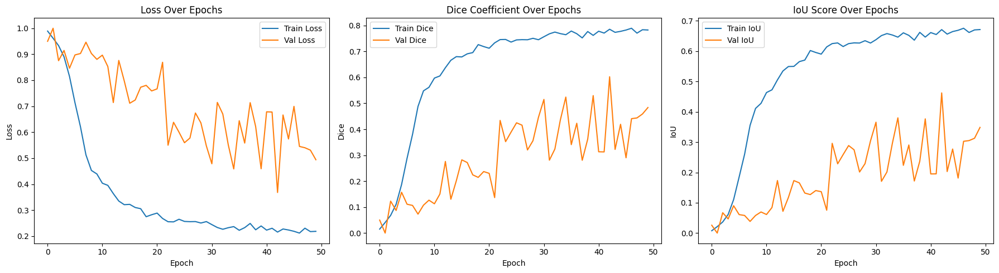

###Evaluation on valid data:

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_no_weigts_start_from_scratch.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_no_weigts_start_from_scratch.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd


# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_firstlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


Output hidden; open in https://colab.research.google.com to view.

29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step
Overall Dice Score: 0.5383
Overall IoU Score:  0.3683


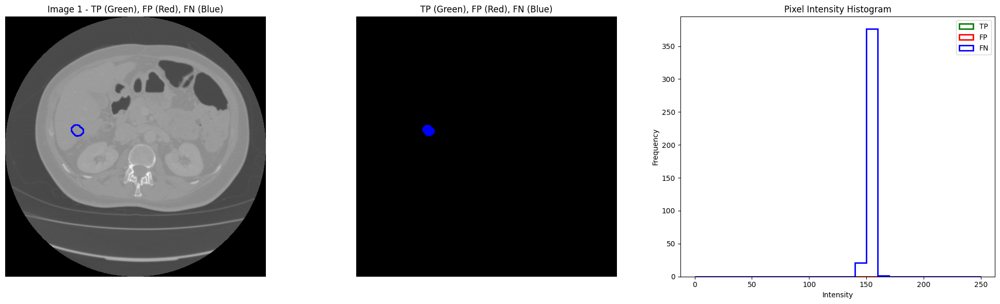

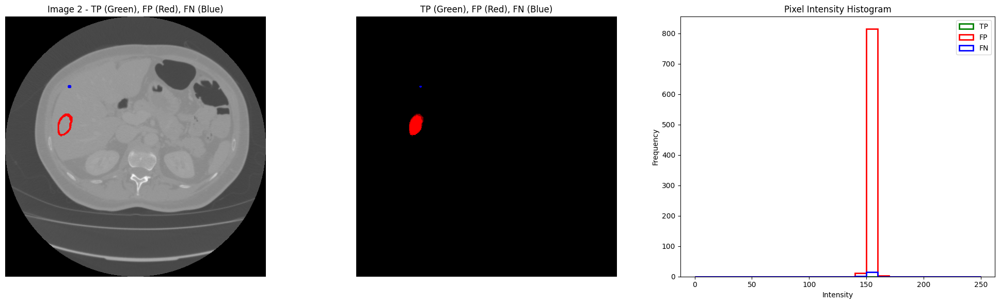

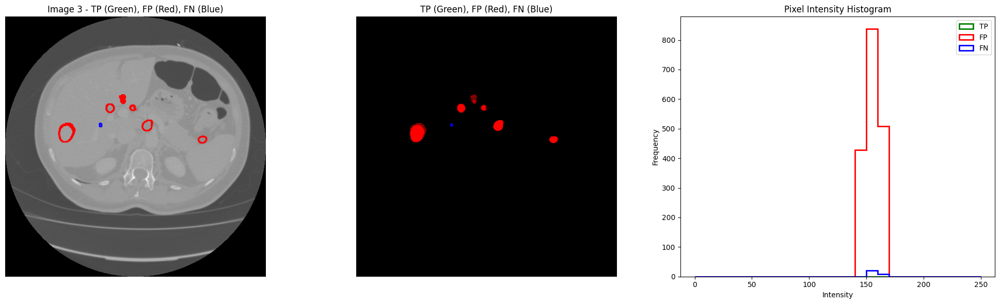

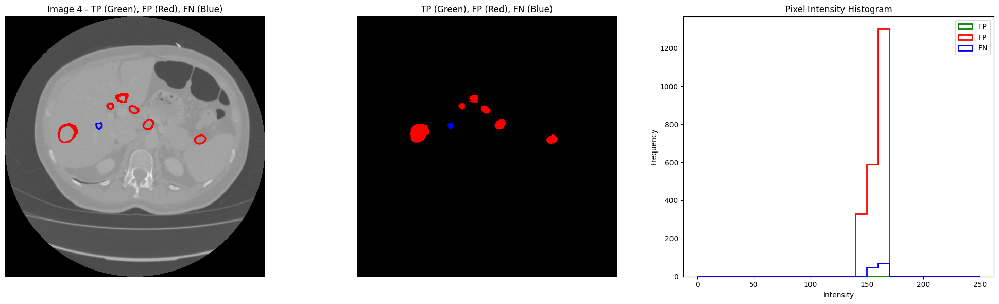

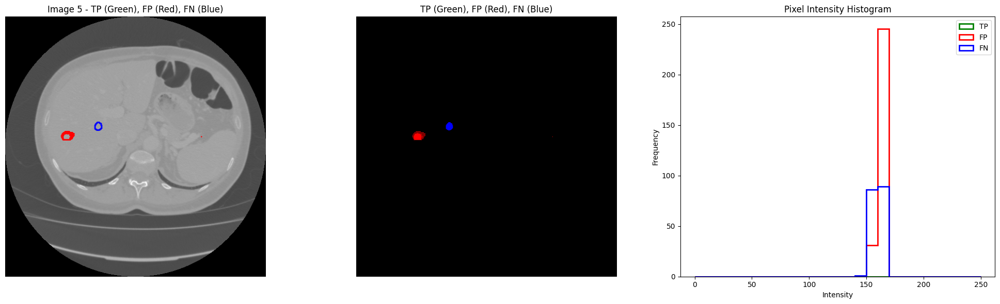

...

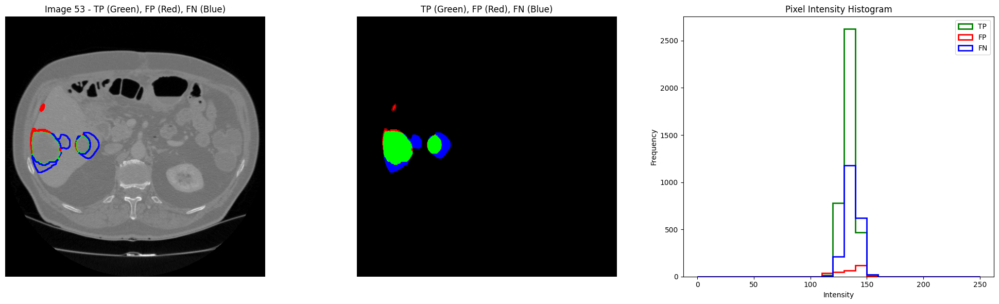

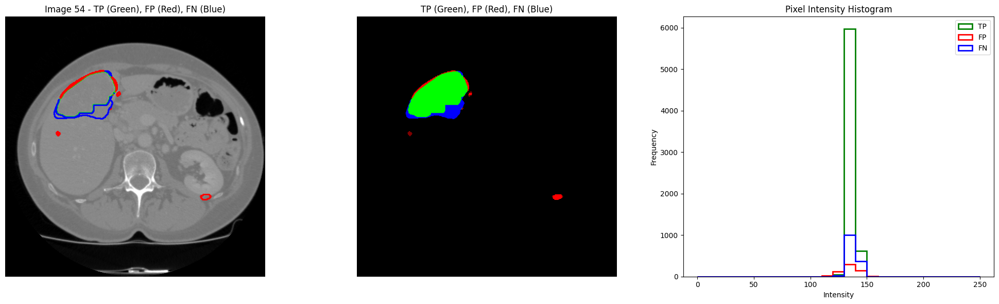

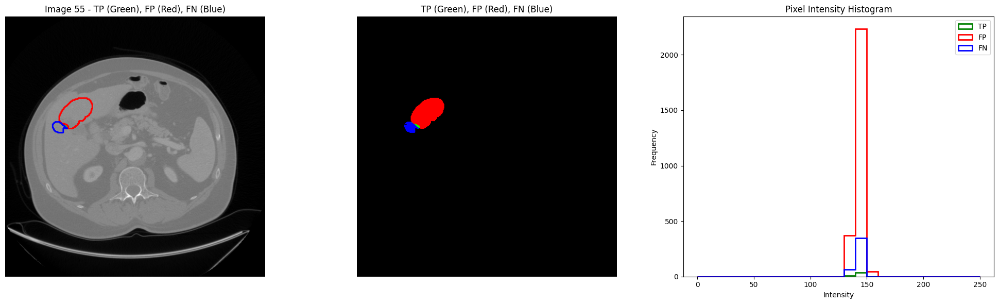

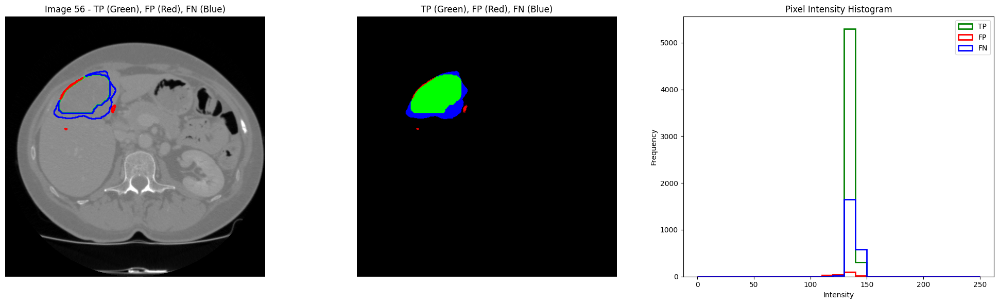

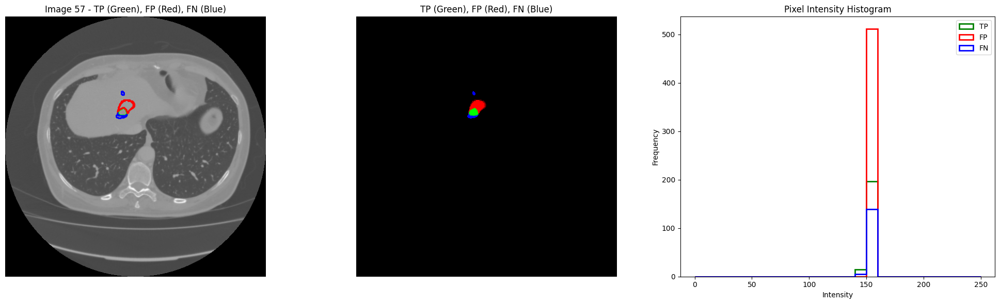

,Image,TP_min,TP_max,TP_mean,FP_min,FP_max,FP_mean,FN_min,FN_max,FN_mean
0,file_0006.png,NaN,NaN,NaN,NaN,NaN,NaN,148.0,160.0,152.236181
1,file_0011.png,NaN,NaN,NaN,147.0,161.0,153.605072,149.0,156.0,151.733333
2,file_0012.png,NaN,NaN,NaN,140.0,167.0,155.092446,151.0,164.0,158.448276
3,file_0013.png,NaN,NaN,NaN,141.0,169.0,158.062190,154.0,166.0,159.931624
4,file_0019.png,NaN,NaN,NaN,150.0,167.0,161.503623,149.0,166.0,159.380682


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd


# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/unetpp_input_adapter_ct.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/input_adapter_layers/input_adapter_layers/shapeprior_input_adapter_freeze_firstlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


In [ ]:

# Check how many NaN values are in the dataframe
nan_summary = df_stats.isna().sum()
nan_summary.head()

,0
Image,0
TP_min,14
TP_max,14
TP_mean,14
FP_min,3


<ipython-input-21-20b5c24a1ca5>:7: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([df_clean['TP_mean'], df_clean['FP_mean'], df_clean['FN_mean']],


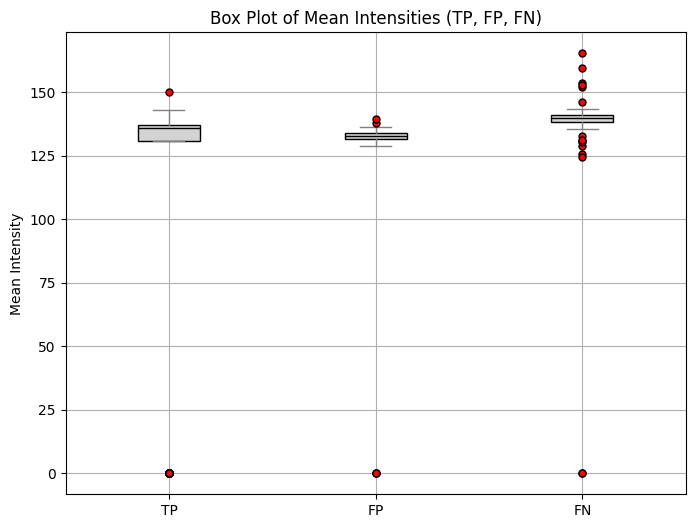

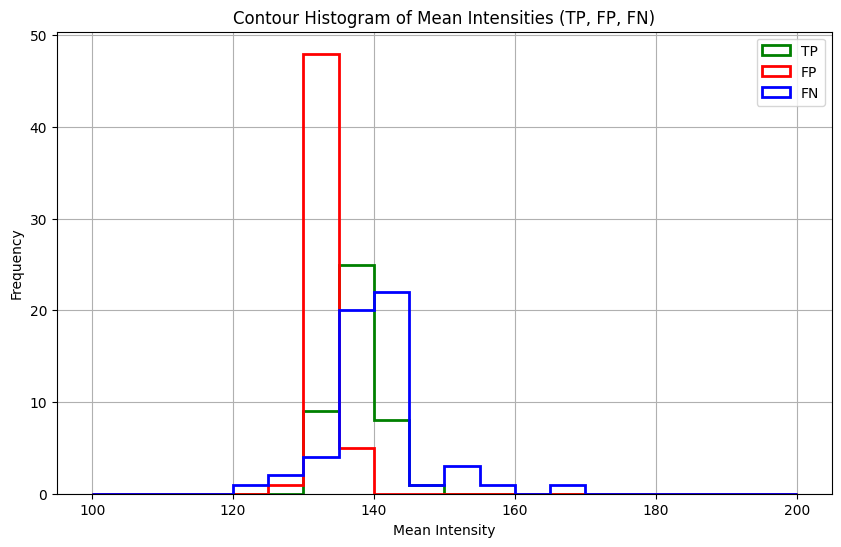

In [ ]:

# Drop rows with any None values for fair plotting
df_clean =  df_stats.fillna(0)


# Boxplot for TP, FP, FN mean intensities
plt.figure(figsize=(8, 6))
plt.boxplot([df_clean['TP_mean'], df_clean['FP_mean'], df_clean['FN_mean']],
            labels=["TP", "FP", "FN"],
            patch_artist=True,
            boxprops=dict(facecolor="lightgray"),
            medianprops=dict(color="black"),
            whiskerprops=dict(color="gray"),
            capprops=dict(color="gray"),
            flierprops=dict(markerfacecolor="red", marker='o', markersize=5, linestyle='none'))
plt.title("Box Plot of Mean Intensities (TP, FP, FN)")
plt.ylabel("Mean Intensity")
plt.grid(True)
plt.show()

# Histogram of TP, FP, FN mean intensities
# Modified histogram using contour-style line plots instead of filled bars
plt.figure(figsize=(10, 6))
bins = np.arange(100, 201, 5)

# Line (step) histograms for each category
plt.hist(df_clean['TP_mean'], bins=bins, color='green', label='TP', histtype='step', linewidth=2)
plt.hist(df_clean['FP_mean'], bins=bins, color='red', label='FP', histtype='step', linewidth=2)
plt.hist(df_clean['FN_mean'], bins=bins, color='blue', label='FN', histtype='step', linewidth=2)

plt.title("Contour Histogram of Mean Intensities (TP, FP, FN)")
plt.xlabel("Mean Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()


###Evaluation on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_no_weigts_start_from_scratch.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model2:Weights of pretrained model loaded but all layers unfreezed

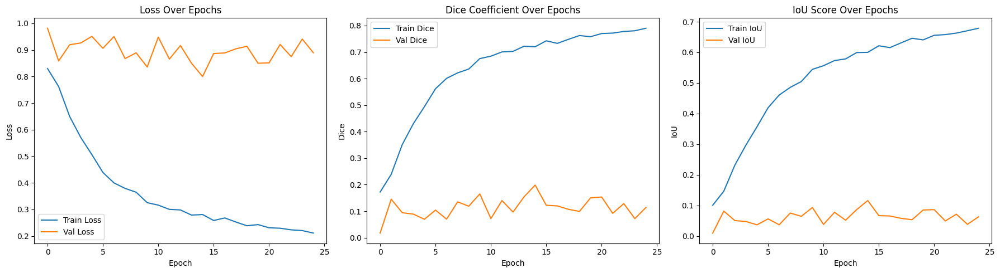

###Evaluation on valid set

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_unfreeze_all_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluation on test *sets*

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_unfreeze_all_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model3:freeze all layers only unfreeze(train) last classification layer

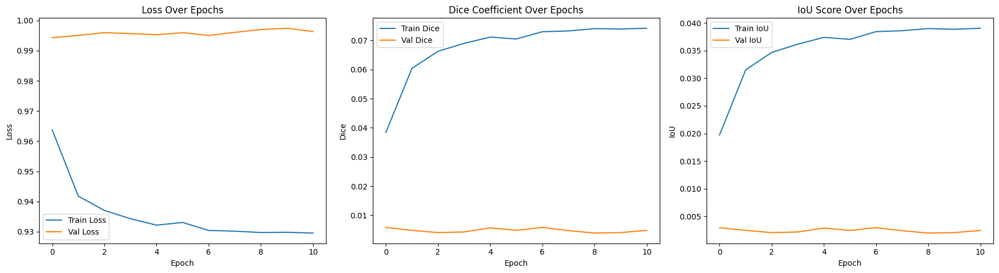

###ُEvaluate on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase1_lastlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluation on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase1_lastlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model4:freeze only first layer(conv00)



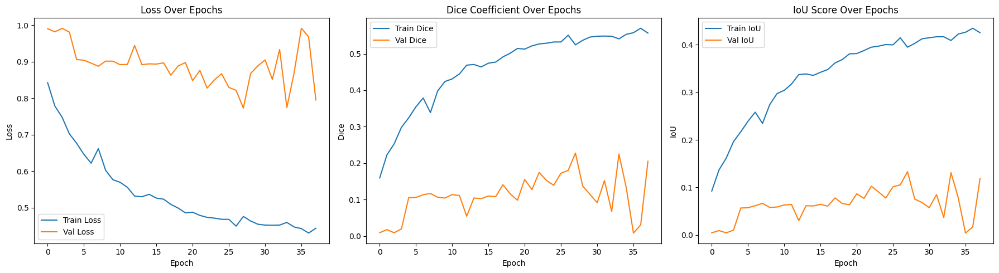






###Evaluate on validd sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase2_freeze_firstlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase2_freeze_firstlayer.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model5:freeze first two layers(conv00 and conv10)

1.   List item

1.   List item

1.   List item
2.   List item


2.   List item


2.   List item



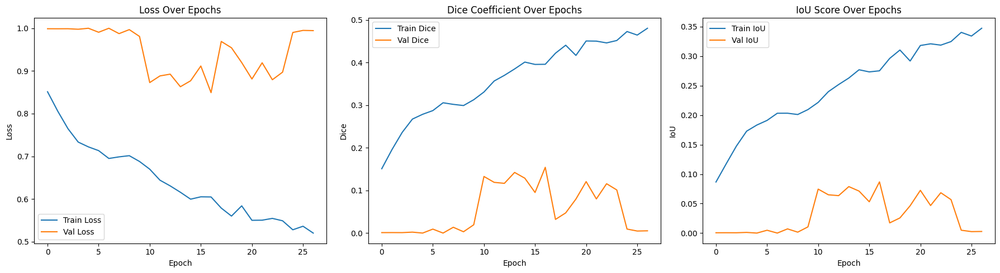

###Evaluation on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_two_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_two_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model6:Freeze first three layers(conv00,conv 10 and conv 20)

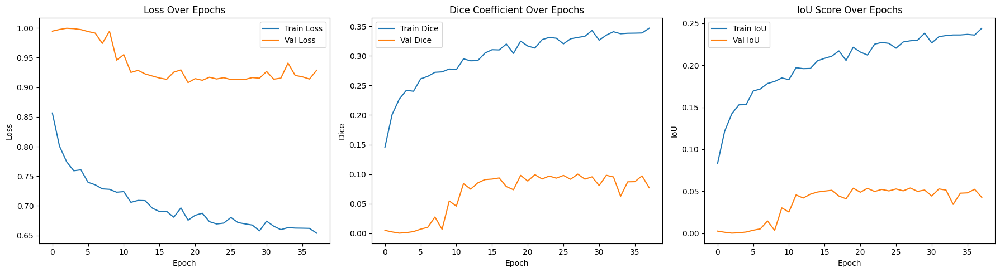

###Evaluation on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_three_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluation on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_three_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model 7:freeze four layers in encoder(conv 00,con10,con20 conv30)

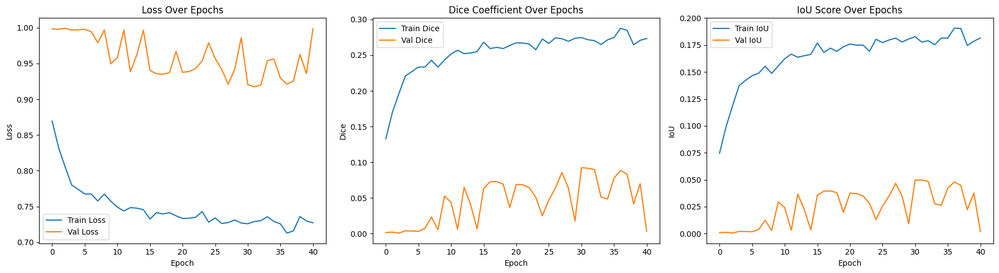

###Evaluate on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_four_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_four_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model8:Freeze encoder and bottlneck

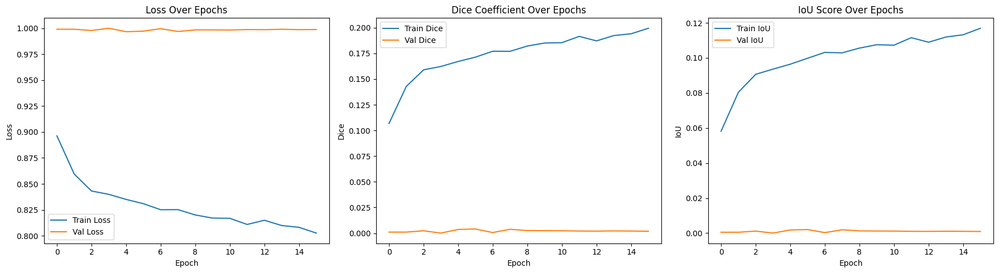

###Evaluate on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_five_layers_orallencoder.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###ُEvaluate on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_five_layers_orallencoder.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model9:Freeze shallow nested decoders conv01, conv11, conv21, conv31


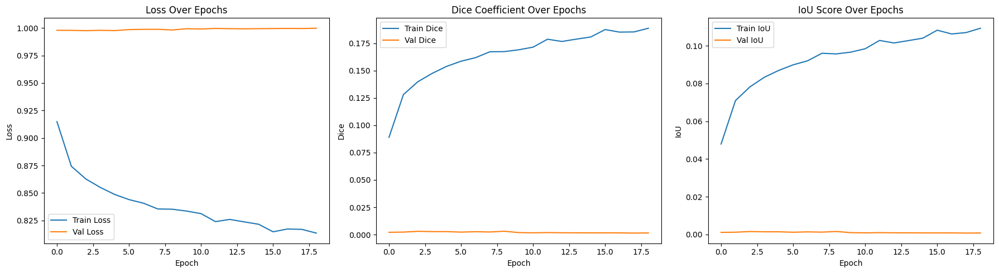

###Evalaute on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_shallow_nested_decoder.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_shallow_nested_decoder.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model10: Freeze encoder + more nested decoders

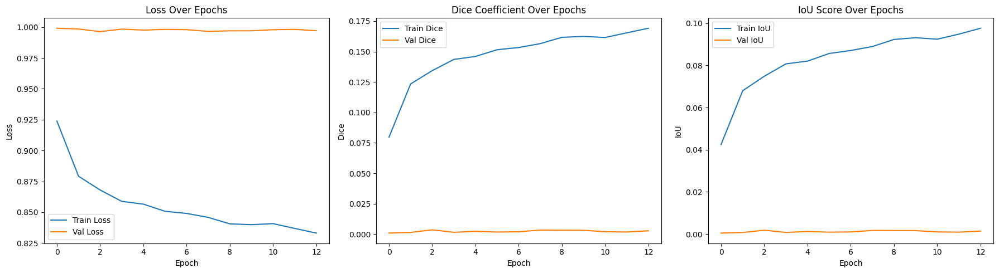

###Evaluate on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_more_nested_decoder.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_more_nested_decoder.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model 11:Freeze encoder + deeper nested decoders

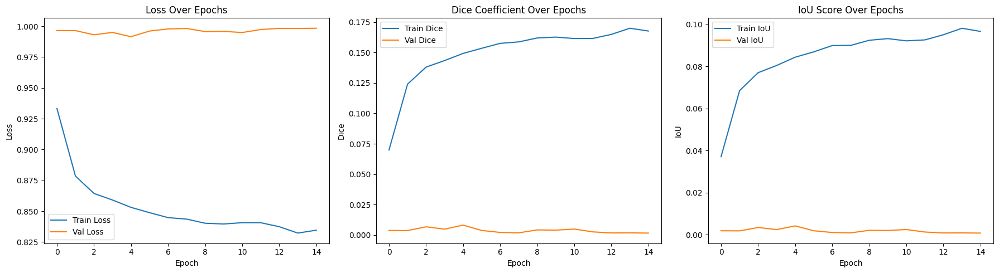

###Evalaute on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_deeper_nested_decoder.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluate on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_deeper_nested_decoder.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model12:Freeze initial Dense encoder

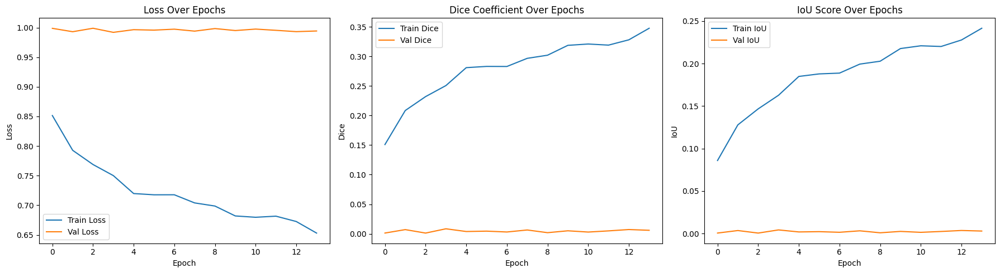

###Evaluation on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_dense_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluation on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_dense_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model13:freeze initial_second Dense encoder

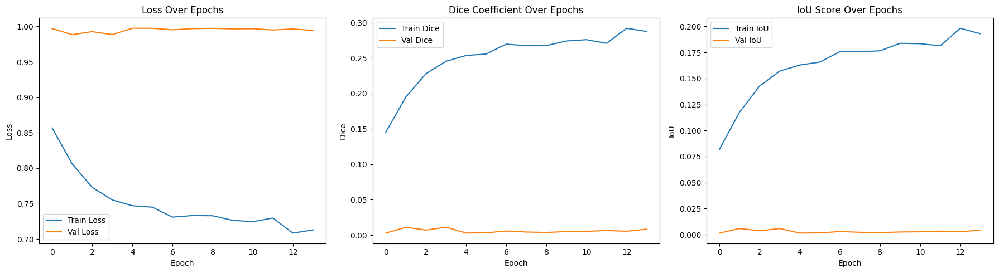

###Evaluation on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_seccond_dense_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluation on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_seccond_dense_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

##Model14:Freeze initial second third dense layers

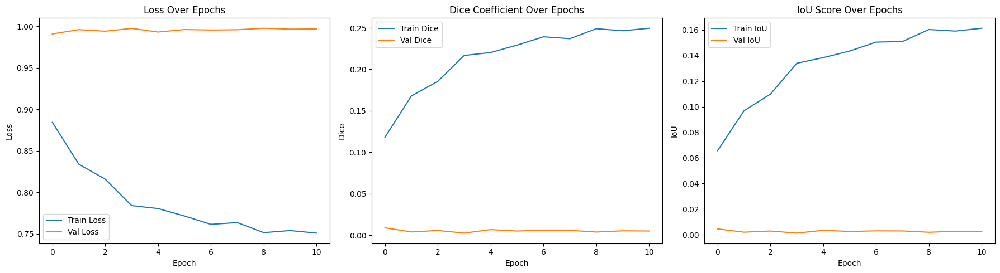

###Evaluation on valid sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_seccond_third_dense_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

###Evaluation on test sets

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_seccond_third_dense_layers.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

### Experiment Results

| Model                          | val Dice Score | val IoU Score | test Dice Score | test IoU Score |
|-------------------------------|----------------|---------------|------------------|----------------|
| Use Pretrained Model for Inference | 0.0033       | 0.0017      | 0.0015           | 0.0008         |
| Model 1                        | **0.5879**         | **0.4163**        | **0.7020**         | **0.5408**       |
| Model 2                        | 0.2164         | 0.1214        | 0.2935          | 0.1720        |
| Model 3                        | 0.0000         | 0.0000        | 0.0000           | 0.0000         |
| Model 4                        | 0.2512         | 0.1437       | 0.3407           | 0.2053        |
| Model 5                        | 0.1512         | 0.0818        | 0.1706         | 0.0932        |
| Model 6                        | 0.0987         | 0.0519        | 0.1142           | 0.0606        |
| Model 7                        | 0.0926        | 0.0485        | 0.1055          | 0.0557         |
| Model 8                        | 0.0078         | 0.0039        | 0.0071          | 0.0035        |
| Model 9                        | 0.0067        | 0.0034       | 0.0062          | 0.0031         |
| Model 10                       | 0.0052         | 0.0026        | 0.0039           | 0.0020         |
| Model 11                       | 0.0028         | 0.0014        | 0.0025           | 0.0013        |
| Model 12                       | 0.0156         | 0.0078        | 0.0108           | 0.0054        |
| Model 13                       | 0.0203         | 0.0103        | 0.0139      | 0.0070         |
| Model 14                       | 0.0123         | 0.0062        | 0.0083          | 0.0042         |




##Conclusion

Transfer Learning for Liver Tumor Segmentation using UNet++

This study explored the feasibility and effectiveness of cross-organ, cross-modality transfer learning from brain tumor MRI to liver tumor CT segmentation using the UNet++ architecture. The key focus was to determine whether progressively fine-tuning a pretrained model, combined with anatomical priors, can enhance generalization in a domain with limited annotated data.

------------------------------------------------------------
Key Findings:
------------------------------------------------------------

1. Baseline Training from Scratch (Model 1):
   - Combined Dice + shape prior loss yielded the best overall performance.
   - Validation DSC/IoU: 0.5879 / 0.4163
   - Test DSC/IoU: 0.7020 / 0.5408
   => Learning directly from the target domain with anatomical priors enables clinically useful segmentation.

2. Direct Fine-Tuning of All Layers (Model 2):
   - Severely underperformed despite using pretrained weights.
   - Validation DSC/IoU: 0.2164 / 0.1214
   - Test DSC/IoU: 0.2935 / 0.1720
   => Suggests feature misalignment due to large domain shifts.

3. Progressive Freezing of Encoder Layers (Models 3–14):
   - Resulted in limited learning capacity.
   - Most models showed validation/test DSC < 0.2 and IoU < 0.1
   => Early encoder layers pretrained on brain MRI are not directly transferable to liver CT.

4. Partial Freezing (Models 4–5):
   - Freezing the first one or two encoder layers gave slightly better results than freezing deeper layers.
   - Best result (Model 4): Test DSC/IoU: 0.3407 / 0.2053
   => Still underperforms compared to training from scratch.

5. Freezing Nested Decoder Layers (Models 9–11):
   - Nearly zero learning capacity and performance.
   => Decoder layers need to be adapted to the specific anatomy and modality of the target domain.

------------------------------------------------------------
Implications:
------------------------------------------------------------

- Transfer learning from brain MRI to liver CT using UNet++ is not directly effective without adaptation.
  - Due to stark differences in imaging texture, contrast, and anatomical structures.

- Shape prior loss helps guide the model to produce more anatomically consistent outputs.
  - Effective when training from scratch but insufficient to overcome poor feature transfer.

------------------------------------------------------------


#Conclusion: Why This Transfer Learning Strategy Fails and What to Do Instead

 The results across all transfer experiments demonstrate that this transfer learning strategy is ineffective in this scenario.

Despite using progressive unfreezing and combined losses (Dice + shape prior), none of the transfer-based models outperformed the  trained from scratch. In many cases, transfer learning severely degraded performance, with validation and test Dice/IoU scores approaching zero. These failures highlight the incompatibility between the source and target domains:

- Modality mismatch: Brain MRI and liver CT differ greatly in appearance, contrast, and feature representation.

- Anatomical divergence: The spatial and structural characteristics of the brain are fundamentally different from those of the liver.


As such, we conclude that this direct transfer learning approach is not suitable for cross-organ, cross-modality segmentation tasks involving brain MRI and liver CT data.

------------------------------------------------------------
Recommendations: More Sophisticated Transfer Strategies
------------------------------------------------------------

To enable effective knowledge transfer in such challenging settings, future work to consider more advanced and domain-aware strategies, such as:

1. Modality-Specific Feature Adapters
   Insert lightweight adapter layers that learn how to reinterpret MRI-learned
   features for CT data (e.g., modality-aware residual adapters).

2. Domain Adaptation
   Align feature distributions between MRI and CT using adversarial training
   (DANN, CycleGAN-based feature matching) to reduce the modality gap.


3. Image-to-Image Translation
   Use image synthesis (CycleGAN) to convert CT images into pseudo-MRI
   style before feeding them into the pretrained network.

4. Cross-Modality Representation Learning
   Train encoders on multi-modal datasets (MRI + CT), forcing the network to
   learn modality-invariant representations that generalize better across domains.

5. Vision Transformers or Attention Modules
   Introduce architectures with stronger attention capabilities (Swin UNet,
   TransUNet) to help the model learn more flexible spatial relationships.


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model Function ===
def load_model_with_weights(model_path, input_shape=(512, 512, 1)):
    model_instance = UNetPlusPlus(input_shape=input_shape)
    model = model_instance.BuildNetwork()
    model.load_weights(model_path)
    return model

# === Set Directories and Load Images ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images, masks = [], []
for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)
# === Define Your Model Paths ===
model_paths = [
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase2_freeze_firstlayer.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_two_layers.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_three_layers.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_four_layers.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_five_layers_orallencoder.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_shallow_nested_decoder.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_more_nested_decoder.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_deeper_nested_decoder.h5",
    "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_dense_layers.h5",
    "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_seccond_dense_layers.h5",
    "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_seccond_third_dense_layers.h5"
]

# === Load All Models ===
models = [load_model_with_weights(path) for path in model_paths]

# === Predict and Visualize in One Row ===
for i in range(len(images)):
    image = np.expand_dims(images[i], axis=0)
    preds_all = [(model.predict(image) > 0.5).astype(np.float32).squeeze() for model in models]

    plt.figure(figsize=(40, 4))

    # Display Original Image
    plt.subplot(1, 14, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title("Image")
    plt.axis('off')

    # Display Ground Truth
    plt.subplot(1, 14, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    # Display Predictions: Model 1 to Model 12
    for j, pred in enumerate(preds_all):
        plt.subplot(1, 14, j + 3)
        plt.imshow(pred, cmap='gray')
        plt.title(f"Model {j+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model Function ===
def load_model_with_weights(model_path, input_shape=(512, 512, 1)):
    model_instance = UNetPlusPlus(input_shape=input_shape)
    model = model_instance.BuildNetwork()
    model.load_weights(model_path)
    return model

# === Set Directories and Load Images ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images, masks = [], []
for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)
# === Define Your Model Paths ===
model_paths = [
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase2_freeze_firstlayer.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_two_layers.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_three_layers.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_four_layers.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_freeze_first_five_layers_orallencoder.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_shallow_nested_decoder.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_more_nested_decoder.h5",
    "/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_deeper_nested_decoder.h5",
    "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_dense_layers.h5",
    "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_seccond_dense_layers.h5",
    "/content/drive/MyDrive/shape_prior_models_dense_layers/shape_prior_models_dense_layers/shapeprior_tuned_phase3_initial_seccond_third_dense_layers.h5"]

# === Load All Models ===
models = [load_model_with_weights(path) for path in model_paths]

# === Predict and Visualize in One Row ===
for i in range(len(images)):
    image = np.expand_dims(images[i], axis=0)
    preds_all = [(model.predict(image) > 0.5).astype(np.float32).squeeze() for model in models]

    plt.figure(figsize=(40, 4))

    # Display Original Image
    plt.subplot(1, 14, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title("Image")
    plt.axis('off')

    # Display Ground Truth
    plt.subplot(1, 14, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    # Display Predictions: Model 1 to Model 12
    for j, pred in enumerate(preds_all):
        plt.subplot(1, 14, j + 3)
        plt.imshow(pred, cmap='gray')
        plt.title(f"Model {j+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/workspace/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py'


=== Processing file_0009.png ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
True Positive Intensities: []
False Positive Intensities: []
False Negative Intensities: [148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 161, 163]


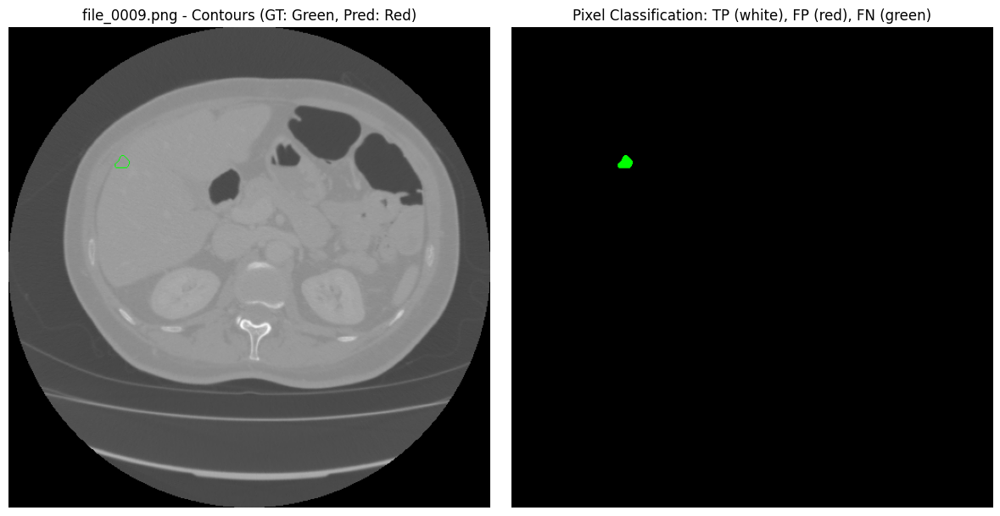

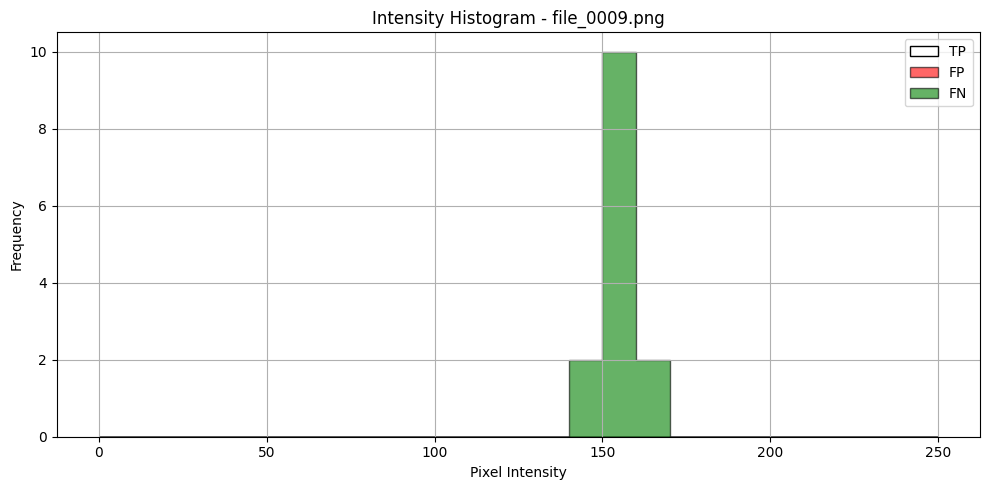


=== Processing file_0015.png ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
True Positive Intensities: []
False Positive Intensities: [122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153]
False Negative Intensities: [144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159]


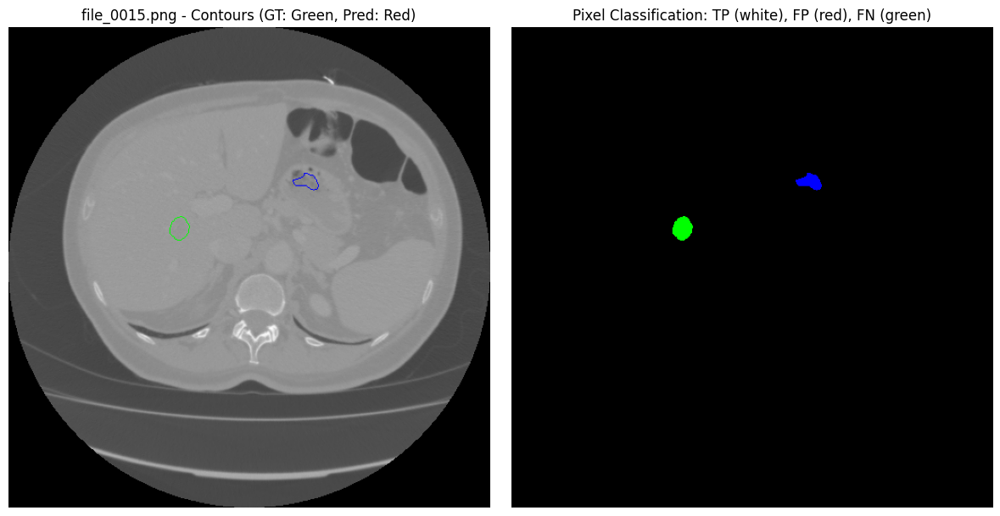

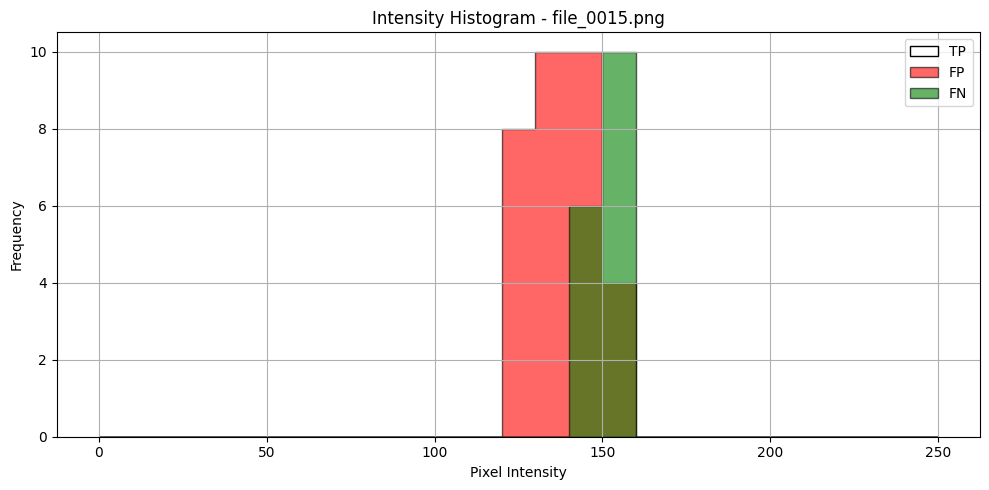


=== Processing file_0021.png ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
True Positive Intensities: [126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 149]
False Positive Intensities: [115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 152]
False Negative Intensities: [124, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 149]


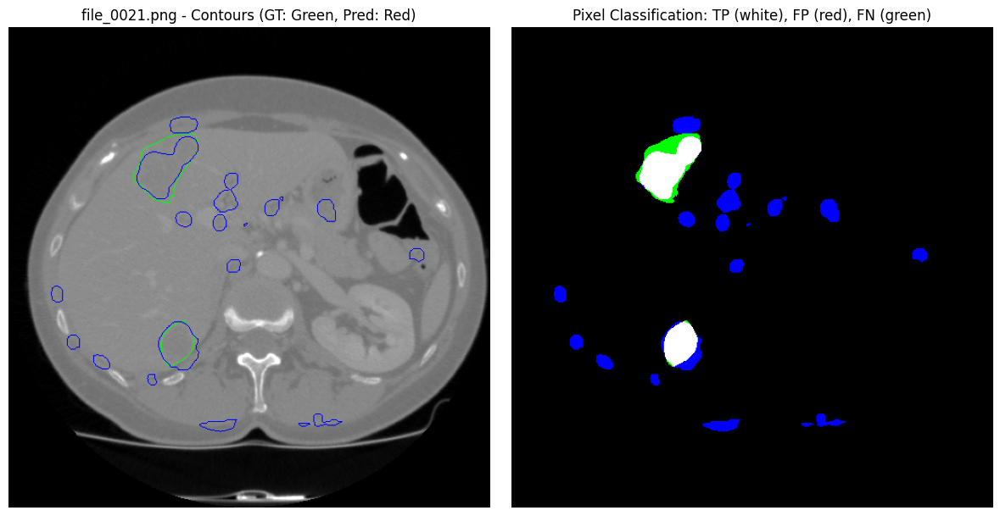

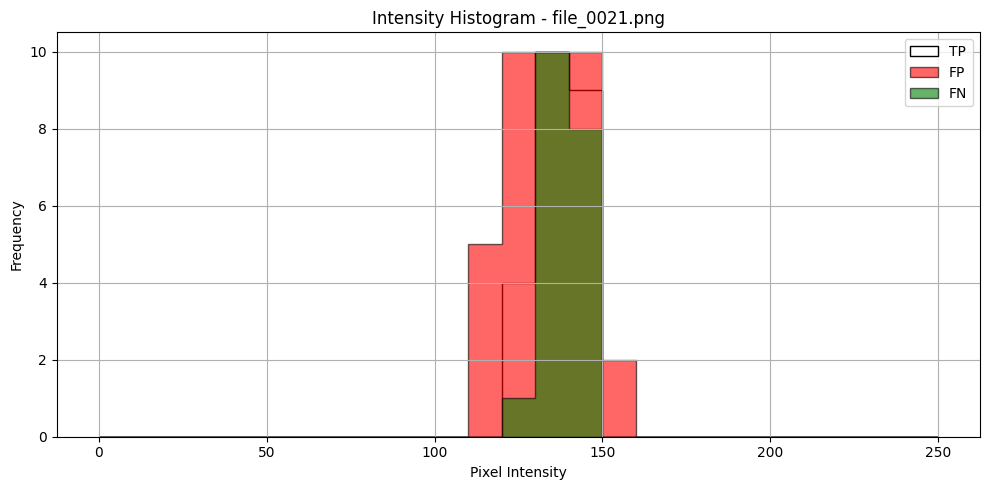


=== Processing file_0037.png ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
True Positive Intensities: [125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 149, 150]
False Positive Intensities: [115, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 152]
False Negative Intensities: [133, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147]


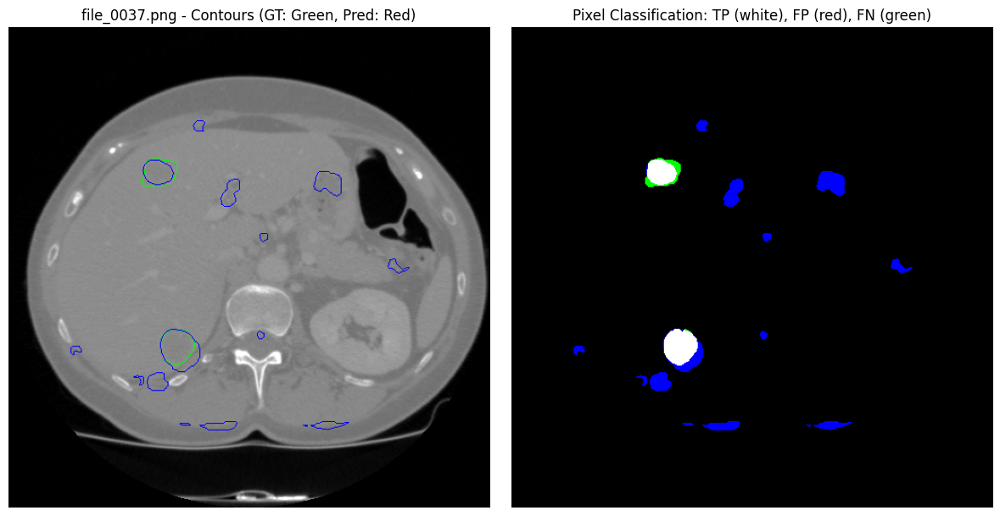

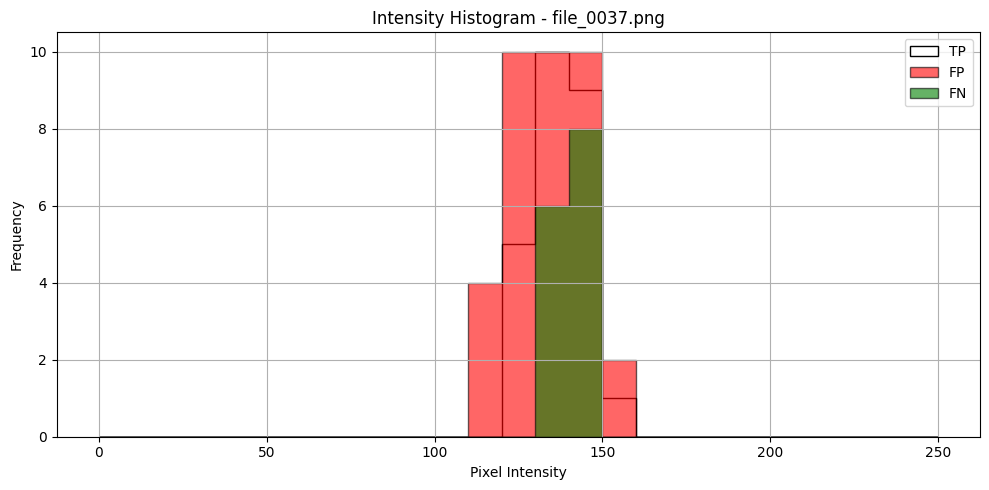


=== Processing file_0042.png ===
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
True Positive Intensities: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 144]
False Positive Intensities: [114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 150]
False Negative Intensities: [129, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148]


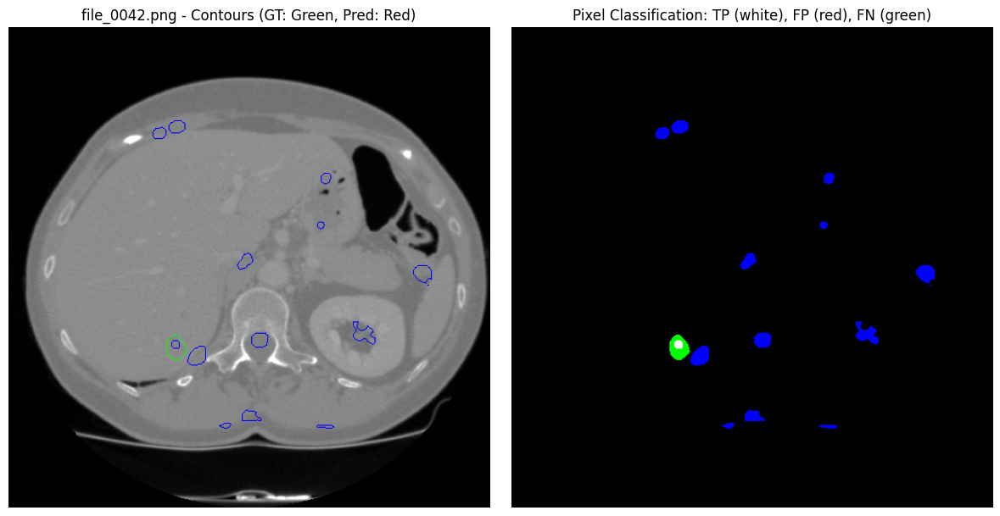

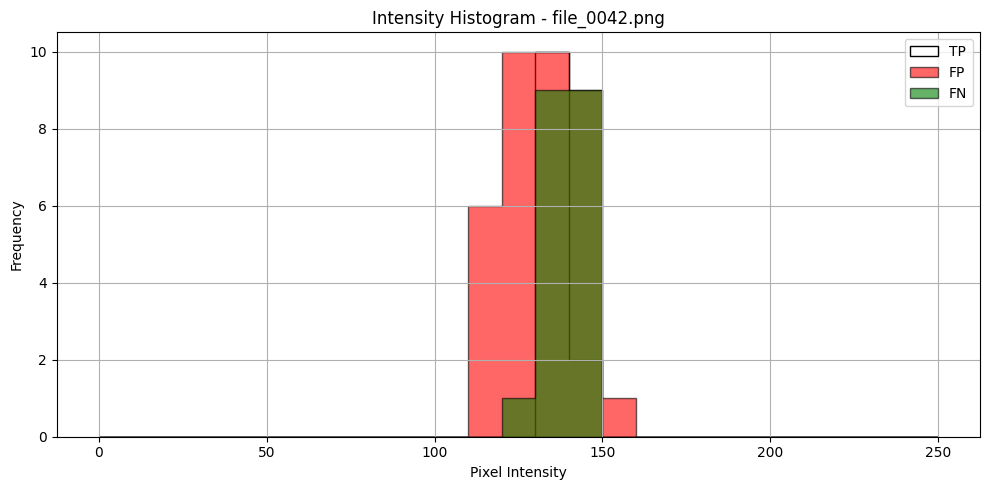

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import importlib.util
from tensorflow.keras.models import load_model

# === Load UNet++ Model Definition ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build and Load Model Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_no_weigts_start_from_scratch.h5")

# === Define Image and Mask Paths ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

# === Loop Through Validation Images ===
for img_id in image_ids[:5]:  # adjust range as needed
    print(f"\n=== Processing {img_id} ===")

    # Load image and mask
    img_path = os.path.join(img_dir, img_id)
    mask_path = os.path.join(mask_dir, img_id)

    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE).astype(np.uint8)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask_bin = (mask >= 255).astype(np.uint8)

    img_resized = cv2.resize(img, (img_size, img_size))
    mask_bin = cv2.resize(mask_bin, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    # Predict
    input_img = np.expand_dims(img_resized, axis=(0, -1)).astype(np.float32) / 255.0
    pred = model.predict(input_img)[0, ..., 0]
    pred_bin = (pred > 0.5).astype(np.uint8)

    # === Generate Contour Overlay ===
    overlay = cv2.cvtColor(img_resized, cv2.COLOR_GRAY2BGR)
    contours_gt, _ = cv2.findContours(mask_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours_pred, _ = cv2.findContours(pred_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_gt, -1, (0, 255, 0), 1)  # Green: GT
    cv2.drawContours(overlay, contours_pred, -1, (0, 0, 255), 1)  # Red: Prediction

    # === Pixel Classification ===
    TP = (mask_bin == 1) & (pred_bin == 1)
    FP = (mask_bin == 0) & (pred_bin == 1)
    FN = (mask_bin == 1) & (pred_bin == 0)

    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [255, 255, 255]  # TP: white
    viz_map[FP] = [0, 0, 255]      # FP: red
    viz_map[FN] = [0, 255, 0]      # FN: green

    # === Unique Intensity Values ===
    intens_tp = sorted(set(img_resized[TP].tolist()))
    intens_fp = sorted(set(img_resized[FP].tolist()))
    intens_fn = sorted(set(img_resized[FN].tolist()))

    print(f"True Positive Intensities: {intens_tp}")
    print(f"False Positive Intensities: {intens_fp}")
    print(f"False Negative Intensities: {intens_fn}")

    # === Plot: Overlay + Classification Map ===
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"{img_id} - Contours (GT: Green, Pred: Red)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("Pixel Classification: TP (white), FP (red), FN (green)")
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()

    # === Plot: Intensity Histogram ===
    bins = np.arange(0, 257, 10)

    plt.figure(figsize=(10, 5))
    plt.hist(intens_tp, bins=bins, color='white', edgecolor='black', label='TP', histtype='stepfilled')
    plt.hist(intens_fp, bins=bins, color='red', edgecolor='black', label='FP', histtype='stepfilled', alpha=0.6)
    plt.hist(intens_fn, bins=bins, color='green', edgecolor='black', label='FN', histtype='stepfilled', alpha=0.6)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.title(f"Intensity Histogram - {img_id}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


same model with no hflip

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point2.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()

model_path = "/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point2.h5"
model.load_weights(model_path)

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Visualize All Results ===
for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i].squeeze(), cmap='gray')
    plt.title(f"Image {i+1}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(masks[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(preds_bin[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_no_weigts_start_from_scratch.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images, masks = [], []
for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# --- NEW: total counters ---
total_tp, total_fp, total_fn = 0, 0, 0

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # --- accumulate totals ---
    tp_count, fp_count, fn_count = int(np.sum(TP)), int(np.sum(FP)), int(np.sum(FN))
    total_tp += tp_count
    total_fp += fp_count
    total_fn += fn_count

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]
    viz_map[FP] = [255, 0, 0]
    viz_map[FN] = [0, 0, 255]

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_count': tp_count,
        'FP_count': fp_count,
        'FN_count': fn_count,
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    if len(tp_vals): axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    if len(fp_vals): axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    if len(fn_vals): axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
print(df_stats.head())

# --- print totals ---
print("\n=== Total Pixel Counts Across Validation Set ===")
print(f"Total True Positives (TP): {total_tp}")
print(f"Total False Positives (FP): {total_fp}")
print(f"Total False Negatives (FN): {total_fn}")


Output hidden; open in https://colab.research.google.com to view.

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/shape_prior_models/shape_prior_models/shapeprior_no_weigts_start_from_scratch.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images, masks = [], []
for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# --- NEW: total counters ---
total_tp, total_fp, total_fn = 0, 0, 0

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # --- accumulate totals ---
    tp_count, fp_count, fn_count = int(np.sum(TP)), int(np.sum(FP)), int(np.sum(FN))
    total_tp += tp_count
    total_fp += fp_count
    total_fn += fn_count

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]
    viz_map[FP] = [255, 0, 0]
    viz_map[FN] = [0, 0, 255]

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_count': tp_count,
        'FP_count': fp_count,
        'FN_count': fn_count,
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    if len(tp_vals): axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    if len(fp_vals): axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    if len(fn_vals): axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
print(df_stats.head())

# --- print totals ---
print("\n=== Total Pixel Counts Across Validation Set ===")
print(f"Total True Positives (TP): {total_tp}")
print(f"Total False Positives (FP): {total_fp}")
print(f"Total False Negatives (FN): {total_fn}")


Output hidden; open in https://colab.research.google.com to view.

#track2

/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point08.h5

/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point2.h5

/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point6.h5

In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point08.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
q1

In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point08.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


Output hidden; open in https://colab.research.google.com to view.

____________________________________________________________

In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point2.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


Output hidden; open in https://colab.research.google.com to view.

In [6]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point2.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


Output hidden; open in https://colab.research.google.com to view.

In [7]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point6.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/valid/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


Output hidden; open in https://colab.research.google.com to view.

In [8]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import pandas as pd

# === Load UNet++ Architecture ===
unetpp_path = "/content/drive/MyDrive/workspace/orkspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Build Model and Load Weights ===
input_shape = (512, 512, 1)
model_instance = UNetPlusPlus(input_shape=input_shape)
model = model_instance.BuildNetwork()
model.load_weights("/content/drive/MyDrive/3dircadmodels/3dircadmodels/shapeprior_no_weigts_start_from_scratch_point6.h5")

# === Load and Preprocess Images and Masks ===
img_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/images"
mask_dir = "/content/drive/MyDrive/final_split_balanced/final_split_balanced/test/masks"
img_size = 512

image_ids = sorted([
    f for f in os.listdir(img_dir)
    if f.endswith(".png") and os.path.exists(os.path.join(mask_dir, f))
])

images = []
masks = []

for img_id in image_ids:
    img = cv2.imread(os.path.join(img_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    mask = cv2.imread(os.path.join(mask_dir, img_id), cv2.IMREAD_GRAYSCALE).astype(np.float32)
    mask = (mask >= 255).astype(np.float32)

    img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_LINEAR)
    mask = cv2.resize(mask, (img_size, img_size), interpolation=cv2.INTER_NEAREST)

    images.append(np.expand_dims(img, axis=-1))
    masks.append(np.expand_dims(mask, axis=-1))

images = np.array(images)
masks = np.array(masks)

# === Predict and Evaluate ===
preds = model.predict(images, batch_size=2)
preds_bin = (preds > 0.5).astype(np.float32)

def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

overall_dice = dice_score(masks, preds_bin)
overall_iou = iou_score(masks, preds_bin)

print(f"Overall Dice Score: {overall_dice:.4f}")
print(f"Overall IoU Score:  {overall_iou:.4f}")

# === Collect stats across all images ===
stats = []

# === Visualize per Image ===
for i in range(len(images)):
    orig = (images[i].squeeze() * 255).astype(np.uint8)
    gt = masks[i].squeeze().astype(np.uint8)
    pred = preds_bin[i].squeeze().astype(np.uint8)

    # Pixel-wise logic
    TP = (gt == 1) & (pred == 1)
    FP = (gt == 0) & (pred == 1)
    FN = (gt == 1) & (pred == 0)

    # Overlay
    overlay = cv2.cvtColor(orig, cv2.COLOR_GRAY2BGR)

    # TP contours → green
    tp_mask = (TP.astype(np.uint8)) * 255
    contours_tp, _ = cv2.findContours(tp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_tp, -1, (0, 255, 0), 2)  # Green

    # FP contours → red
    fp_mask = (FP.astype(np.uint8)) * 255
    contours_fp, _ = cv2.findContours(fp_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fp, -1, (255, 0, 0), 2)  # Red

    # FN contours → blue
    fn_mask = (FN.astype(np.uint8)) * 255
    contours_fn, _ = cv2.findContours(fn_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(overlay, contours_fn, -1, (0, 0, 255), 2)  # Blue

    # Classification Map
    viz_map = np.zeros((img_size, img_size, 3), dtype=np.uint8)
    viz_map[TP] = [0, 255, 0]     # Green
    viz_map[FP] = [255, 0, 0]     # Red
    viz_map[FN] = [0, 0, 255]     # Blue

    # Intensities
    tp_vals = orig[TP]
    fp_vals = orig[FP]
    fn_vals = orig[FN]

    # Save intensity stats per image
    stats.append({
        'Image': image_ids[i],
        'TP_min': int(np.min(tp_vals)) if len(tp_vals) else None,
        'TP_max': int(np.max(tp_vals)) if len(tp_vals) else None,
        'TP_mean': float(np.mean(tp_vals)) if len(tp_vals) else None,
        'FP_min': int(np.min(fp_vals)) if len(fp_vals) else None,
        'FP_max': int(np.max(fp_vals)) if len(fp_vals) else None,
        'FP_mean': float(np.mean(fp_vals)) if len(fp_vals) else None,
        'FN_min': int(np.min(fn_vals)) if len(fn_vals) else None,
        'FN_max': int(np.max(fn_vals)) if len(fn_vals) else None,
        'FN_mean': float(np.mean(fn_vals)) if len(fn_vals) else None
    })

    # === Plot 3-Column Layout ===
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    axs[0].imshow(overlay)
    axs[0].set_title(f"Image {i+1} - TP (Green), FP (Red), FN (Blue)")
    axs[0].axis("off")

    axs[1].imshow(viz_map)
    axs[1].set_title("TP (Green), FP (Red), FN (Blue)")
    axs[1].axis("off")

    bins = np.arange(0, 257, 10)
    axs[2].hist(tp_vals, bins=bins, color='green', label='TP', histtype='step', linewidth=2)
    axs[2].hist(fp_vals, bins=bins, color='red', label='FP', histtype='step', linewidth=2)
    axs[2].hist(fn_vals, bins=bins, color='blue', label='FN', histtype='step', linewidth=2)
    axs[2].set_title("Pixel Intensity Histogram")
    axs[2].set_xlabel("Intensity")
    axs[2].set_ylabel("Frequency")
    axs[2].legend()

    plt.tight_layout()
    plt.show()

# === Create DataFrame for analysis ===
df_stats = pd.DataFrame(stats)
df_stats.head()


Output hidden; open in https://colab.research.google.com to view.